# Trying to capture the real world within a model: Sediment Equation


## 0) Fastscape Basin Example: Grapevine Mountain Fans in Death Valley

<img src="./03images/GrapevineGoogleEarth.jpg" width="1000">

<img src="./03images/Darcyetal2017DataPlots.png" width="1000">
- Example data available from D'arcy et al. (2017) on the fans doi: 10.1111/sed.12308

## 1) Simple Set up of the basin

In [3]:
%load_ext xsimlab.ipython
import numpy as np
import xsimlab as xs
import xarray as xr
import matplotlib.pyplot as plt
import zarr

import GSFast_Gravel 

In [4]:
from fastscape.models import sediment_model
from fastscape.processes import (MultipleFlowRouter)

from fastscape.processes import (Bedrock)
from fastscape.processes import StratigraphicHorizons

from GSFast_Gravel import GravelGSN

model = sediment_model.update_processes({'flow': MultipleFlowRouter,
                                         'bedrock':Bedrock,
                                         'strati': StratigraphicHorizons,
                                         'gsize': GravelGSN 
                                        })

In [12]:
# %create_setup model --default --verbose

Spatial Constraints (and their Impact on the model)

### Spatial Set Up (Bounding Conditions)

To solve a Partial Differential Equation (PDE) as the one shown above, one also needs to specify the geometry of the problem and, most importantly, boundary conditions. In FastScape, the PDE is solved in a rectangular domain of dimensions $L_x\times L_y$ which is discretized using a rectangular (regular) discretization of $n_x\times n_y$ points or *nodes*.

<img src="./03images/Mesh.jpg" width="500">



Impact of spatial set up on channel dynamics:
- Please note (regardless of cell size) if you have too few cells in the downstream and across basin direction, you will not be able to generate 2d channel dynamcis. 
- If you have approxiametly less than 20 across basin cells, you will be transitioning more to a sheet flow scenerio without realistic channels dyanmics
- Reduce or increase your cell size to maintain channel dynamics for a given spatial extent that you are trying to model. 
- Keep in mind that channels will also interact with the boundary conditions set (eg:looped) and this becomes more evident in narrow (too few cells across models)
- Keep your cells square (consider distance and number of cells)

## Sptial Constraints on the model set-up can impact:
1) Erosion/deposition rates, 
2) sedimentfluxes and steady-state times
3) Topography
4) channel dynamics
5) Basically everything


In [5]:
#Real World Data
MeanFanorCatchmentWidth=2.7e3 #meters
NumberofFansorCatchments=8
wm = 17e3 # width of the mountain (in m)
wb = 7e3 # with of the basin (in m)
CellSize=100 #Width of larger channels #m
Boundary=['core','fixed_value','looped','looped']


#Convert this to model Inputs
xl = wm+wb # xl, length of the grid in the x-direction 
yl = MeanFanorCatchmentWidth*NumberofFansorCatchments # yl, length of the mesh in the y-direction 
nx=int(xl/CellSize)+1 #(ranges between 2 (over 20 for channel dynamics) to ~1000.)
ny=int(yl/CellSize)+1 #(ranges between 2(over 20 for channel dynamics) to ~1000.)
x, y = np.meshgrid(np.linspace(0,xl,nx), np.linspace(0,yl,ny)) # creates an x,y mesh

print('Min. Number of Cells Across basin, down basin, or down mountain', int(np.min([wb,wm,yl])/(CellSize)))
print('2D Channel dynamics in the basin are possible',np.where(int(np.min([wb,yl])/(CellSize)>20),'True','False'))
print('The grid cells are square',(x[0,0:2])==(y[0:2,0]))

Min. Number of Cells Across basin, down basin, or down mountain 70
2D Channel dynamics in the basin are possible True
The grid cells are square [ True  True]


- Example of the impact of across basin cells on channel dynamics:
<img src="./03images/SpatialDrainage.png" width="500">

#Notes
#Grid cells need to be square.
#If you want channel dynamics that converge to a similar solution and aren't as impacted by the boundary
#then choose preferably over ~20 cells down and across the basin. Adjust your cell size to meet this requirement.
#Otherwise you are moving towards a 1D sheet flow or a boundary influenced solution.

#The initial topography can influence your solutions (consider this when you are trying to compare simulations and avoid random initial topo).

Temporal Constraints

In [6]:
tf=18e6 #duration of fault activity
timestepbtw_simulation= 10000/2 #ranges between 1000-100000 year time scales. #No set rule for this.
ntime=int(tf/timestepbtw_simulation)+1
timestepbtw_output=100000
nout=int(tf/timestepbtw_output)+1
print('Number of time steps:',tf/timestepbtw_simulation)

Number of time steps: 1800.0


In [7]:
nout

181

Uplift and Subsidence (Imposed and well known)

In [8]:
# subsidence is well known for the study site through seismic data however, we don't know for sure if this was generated over the 18 Myr of fault duration or not. More specifically, there are 
#hypothesized uplift pulses before the uplift rate was continuous. Thus, we will try to impose some initial topography to try to account for this. 

In [9]:
# Uplift
s0=0.0005 
u0=s0*2/3# 0.0001666-0.0003333 (one to two thirds the subsidence rate)
alpha=2.2 #2-2.5 #increase alpha since I made the basin longer
U = xr.DataArray(np.where(x<wm, u0, -s0*np.exp(-(x-wm)/wb*alpha)),dims=['y','x'])


In [302]:
u0

0.0003333333333333333

Initial Topography

FastScape also needs an initial condition, i.e.:

$$h(t=0)=h_0(x,y)$$

which is commonly assumed to be a very small white noise (i.e. of amplitude = 1 m).

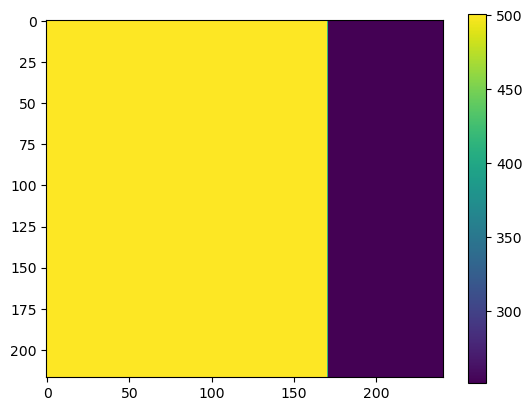

In [10]:
#How much initial topography would their be from a first (2e6) phase of sporadic uplift
SporaticUplift=np.linspace(0.0001, 0.0004, num=10)*100e3 #uplift times the time period.
Baselevel=250
#Initial Topography
h0 = np.ones([ny,nx]) + np.where(x>wm,Baselevel, Baselevel+np.sum(SporaticUplift)) 
plt.imshow(h0)
plt.colorbar()

model=model.drop_processes('init_topography')


In [47]:
# %create_setup model --default --verbose

In [48]:
# Additional Considerations

In [96]:
# %create_setup model --default --verbose


### Trial 1) Simple Set UP

In [48]:
# %create_setup model --default --verbose
import xsimlab as xs

ds_in = xs.create_setup(
    model=model,
    clocks={'time': np.linspace(0,tf,ntime),
           'out': np.linspace(0,tf,nout),
            'out2': np.linspace(tf-timestepbtw_output,tf,1)},
    master_clock = 'time',
    input_vars={
        # nb. of grid nodes in (y, x)
        'grid__shape': [ny,nx],
        # total grid length in (y, x)
        'grid__length': [yl,xl],
        # node status at borders
        'boundary__status': Boundary,
        # uplift rate
        'uplift__rate': U,
        # MFD partioner slope exponent
        'flow__slope_exp': 1.0,
        # drainage area exponent
        'spl__area_exp': 0.4,
        # slope exponent
        'spl__slope_exp': 1,
        # relative tolerance (Gauss-Siedel convergence)
        'spl__tol_rel': 0.0001,
        # absolute tolerance (Gauss-Siedel convergence)
        'spl__tol_abs': 0.0001,
        # max nb. of iterations (Gauss-Siedel convergence)
        'spl__max_iter': 100,
        # bedrock channel incision coefficient
        'spl__k_coef_bedrock': 2e-5,
        # soil (sediment) channel incision coefficient
        'spl__k_coef_soil': 2e-5, #higher k_f is generally more erodible. 
        # detached bedrock transport/deposition coefficient
        'spl__g_coef_bedrock': 1, #transport limited (G over 0.4 with sufficient sediment). Mediam 0.7 from Guerit et al. (2019)?
        # soil (sediment) transport/deposition coefficient
        'spl__g_coef_soil': 1,
        # bedrock diffusivity
        'diffusion__diffusivity_bedrock': 0, #varies depends on your spatial grid resolution! This will change your slopes between the channels in the mountain area. 
        #3e-3 m^2yr^1 at the 10 m scale. Bump up diffusitivty coefficent an order of magnitude for each change in grid magnitude. Cell=100m then diffusivity=3e-2.
        # soil (sediment) diffusivity
        'diffusion__diffusivity_soil': 0,
        # surface topography elevation
        'topography__elevation': h0,
        'strati__freeze_time': np.linspace(0,tf,nout),
        'gsize__D0': 1, 
        # The bedrock source grain size standard deviation
        'gsize__SD0': 0.75,
        # Cv (grain size calculation constant) described in Fedele and Paola (2007) and Duller
        # et al. (2010)
        'gsize__Cv': 0.75,
        # C1 (grain size calculation constant) described in Fedele and Paola (2007) and Duller
        # et al. (2010)
        'gsize__C1': 0.75,
        # Porosity
        'gsize__porosity': 0,
        
        
    },
    output_vars={'topography__elevation': 'out',
                 'bedrock__elevation': 'out',
                 'drainage__flowacc': 'out',
                 'erosion__rate': 'out',
                 'gsize__EFlux': 'out',
                 'gsize__Age': 'out',
                 "strati__elevation": "out2", #only need the final time step
                }
)


In [8]:
zgroup = zarr.group("DeathValleyMountain.zarr", overwrite=True)

In [50]:
with model, xs.monitoring.ProgressBar():
    ds_out = (ds_in.xsimlab.run(model=model, store=zgroup))

             0% | initialize 

In [290]:
zdataset = xr.open_zarr('DeathValleyMountain.zarr').set_index()

zdataset.x.attrs["units"] = "m"
zdataset.y.attrs["units"] = "m"
zdataset.out.attrs["units"] = "years"
zdataset.out2.attrs["units"] = "years"
startbasin=int(wm/CellSize)

aspects= 1#If 2, x direction will be twice as long as y. #xl/yl
sizes= 8

In [93]:
%config InlineBackend.figure_format = 'svg'

## 1.2) Practice Plotting Basin Outputs 

In [283]:
#(not a the best solution to match the data, but good for practice)

### Take a look at Variable Plots

In [21]:
#Take a look at basin 2
from ipyfastscape import TopoViz3d

app = TopoViz3d(zdataset, canvas_height=600, time_dim="out")

app.components['background_color'].set_color('lightgray')
app.components['vertical_exaggeration'].set_factor(5)
app.components['timestepper'].go_to_time(zdataset.out[-1])

app.show()

Scene(background_color='lightgray', children=[WarpByScalar(factor=5.0, input='warp', parent=IsoColor(input=('c…

170.0

### Calculate Topography

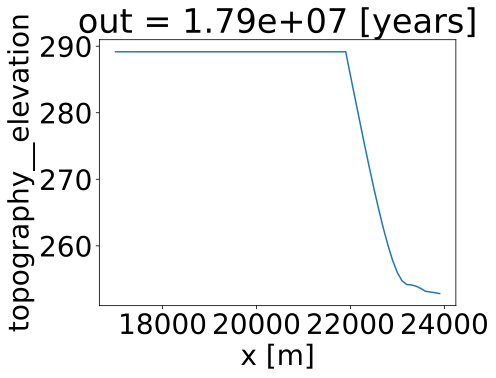

In [94]:
zdataset.topography__elevation.mean('y').isel(x=slice(int(wm/CellSize),-1)).isel(out=-2).plot()

In [95]:
#Uhoh, looks like a cliff.

### Calculate Fluxes

In [96]:
#To get flux per year divide by the timestep between your simulations
Flux=(zdataset.gsize__EFlux*(CellSize*CellSize)) #m^3/yr
#Flux=(zdataset.gsize__EFlux)
MeanFluxMountain=Flux.isel(x=int(wm/CellSize)).isel(out=slice(-int(nout*1/4),-1)).mean('y').mean('out').values #m^3/yr 
#select the flux in the dominant channel
#
#select the main channel
max_drainage_indices = xr.DataArray(zdataset.drainage__flowacc.argmax('y')).load()
ChannelTopo=zdataset.topography__elevation.sel(y=zdataset.y[max_drainage_indices]);
ChannelFlux=Flux.sel(y=zdataset.y[max_drainage_indices]);

(MeanFluxMountain/1e6)/1e9 #m^3/Myr

3.328220840214074e-11

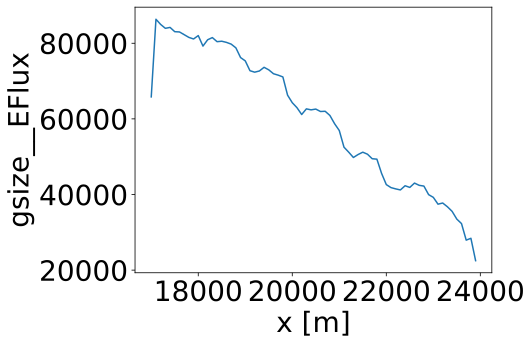

In [97]:
ChannelFlux.isel(out=slice(int((len(zdataset.out)-1)*1/4),-1)).mean('out').isel(x=slice(int(wm/CellSize),-1)).plot()

#### Channel Mobility

In [98]:
#inputs needed:
drain2D_P20=zdataset.drainage__flowacc
Y_2D_P2=zdataset.y

In [99]:
#PREPARE TO run the function
max_drainage_indices = xr.DataArray(zdataset.drainage__flowacc.argmax('y')).load()
Binary=np.zeros_like(drain2D_P20)
DominantDrainage_YPath=drain2D_P20.argmax('y',skipna=True).to_numpy()

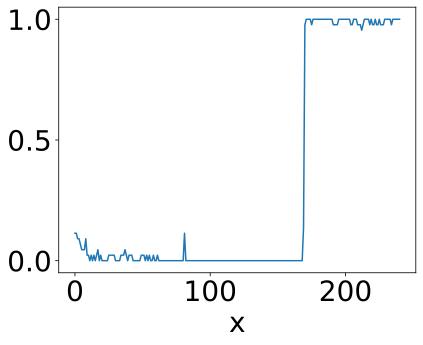

In [100]:
import DominantChannelDynamics as channel



a=xr.DataArray(channel.AvulsionMainChannel(Binary,DominantDrainage_YPath),dims=['time','y','x'])
sumAvulsion_overtimeperiod=a.max('y').isel(time=slice(-int(nout*1/4),-1)).sum('time')
timeInterval_minus1=int(nout*1/4)-1

AvulsionFrequency=sumAvulsion_overtimeperiod/timeInterval_minus1

AvulsionFrequency.plot()

### Local Minima

In [101]:
BasinTopo=zdataset.topography__elevation.isel(x=slice(int(wb/CellSize),-1))


In [102]:
DownBasinSlope=((BasinTopo.isel(x=slice(0,-2)).values)-(BasinTopo.isel(x=slice(1,-1)).values))/CellSize
BinaryMinima=xr.DataArray(np.where(DownBasinSlope<0.01,1,0),dims=['time','y','x'])
MinimaFrequency=BinaryMinima.sum('y').sum('time')/(len(zdataset.out)-1)/len(zdataset.y)

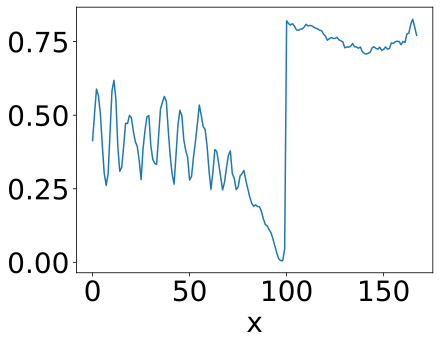

In [103]:
MinimaFrequency.plot()

## Steady-State

### Orogenic Steady State

Orogenic Steady-State Reached after 0.1 Myrs
Mean Steady-State Height at 444.9 m


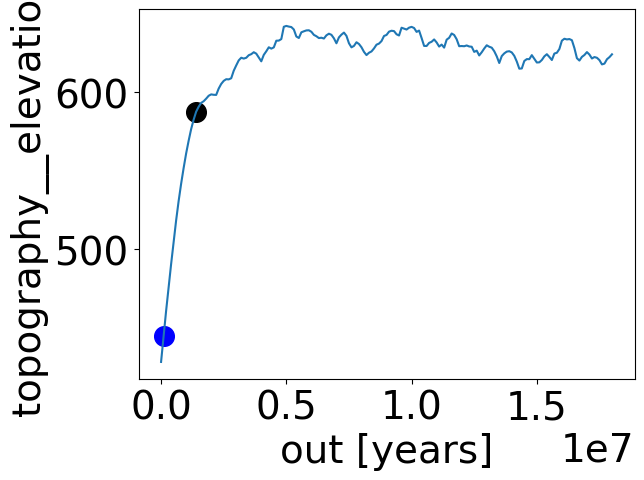

In [291]:


#timestepbtw_output=10000 #yrs
SteadystateHeightTHreshold=(1-np.exp(-1))

MountainMeanHeight=zdataset.topography__elevation.isel(x=slice(0,startbasin)).mean('y').mean('x')

SteadyMountainStartHeight= (MountainMeanHeight.max('out').values*SteadystateHeightTHreshold) #Steady state is defined as when the topographic height reaches 63% of the mean topographic maximum over time. 

SteadyMountainStart=np.where(MountainMeanHeight>=SteadyMountainStartHeight)[0][0]
ActualSteadyMax=MountainMeanHeight.max('out').values
Within5percentMax=np.where(MountainMeanHeight>=ActualSteadyMax*0.95)[0][0]

print('Orogenic Steady-State Reached after',zdataset.out[SteadyMountainStart].values/1e6, "Myrs")
print('Mean Steady-State Height at',round(float(zdataset.topography__elevation.mean('y').mean('x')[SteadyMountainStart].values),2), "m")


zdataset.topography__elevation.mean('y').mean('x').plot()
plt.scatter(zdataset.out[SteadyMountainStart],zdataset.topography__elevation.mean('y').mean('x')[SteadyMountainStart],color='b',s=200)

plt.scatter(zdataset.out[Within5percentMax],zdataset.topography__elevation.mean('y').mean('x')[Within5percentMax],color='k',s=200)

In [269]:
Within5percentMax

14

### Basin Steady-State

In [137]:
# Calculating Basin Steady-state in a similar manner to orogenic steady-state (based on mean and max apex height)

In [104]:
startbasin=int(wm/CellSize)

Basin Steady-State Reached after 1.4 Myrs


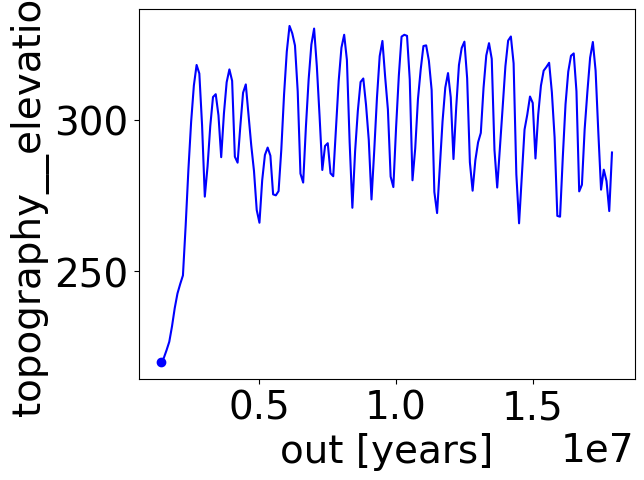

In [292]:
startbasin=int(wm/CellSize)
Cellsize=1000
timestep=1000
firstTimeStepsLimit=Within5percentMax  #ensures that we only look for basin steady-state after orogenic steady-state is reached (within 10% of max)
RoughExtentofFan=-1 #whole simulation

SteadystateHeightTHreshold=(1-np.exp(-1))
basincelllength=len(zdataset.x.isel(x=slice(startbasin,-1)))

BasinB2_25_BasinApex=zdataset.topography__elevation.isel(out=slice(firstTimeStepsLimit,-1)).mean('y').isel(x=slice(startbasin,-1)).max('x') #Capture the fan apex over time
#
BasinB2_25_SteadyBasinApexStartHeight= (BasinB2_25_BasinApex.max('out').values*SteadystateHeightTHreshold) #Steady state is defined as when the topographic height reaches 63% of the mean topographic maximum over time. 
BasinB2_25_SteadyBasinApexStart=np.where(BasinB2_25_BasinApex>=BasinB2_25_SteadyBasinApexStartHeight)[0][0]

print('Basin Steady-State Reached after',zdataset.out.isel(out=slice(firstTimeStepsLimit,-1))[BasinB2_25_SteadyBasinApexStart].values/1e6, "Myrs")

BasinB2_25_BasinApex.plot(color='b')
plt.scatter(zdataset.isel(out=slice(firstTimeStepsLimit,-1)).out[BasinB2_25_SteadyBasinApexStart],BasinB2_25_BasinApex[BasinB2_25_SteadyBasinApexStart],color='b')



In [141]:
#Calculate Basin Steady-state based on a constant slope

Mean basin slope: 0.0007144108778380697


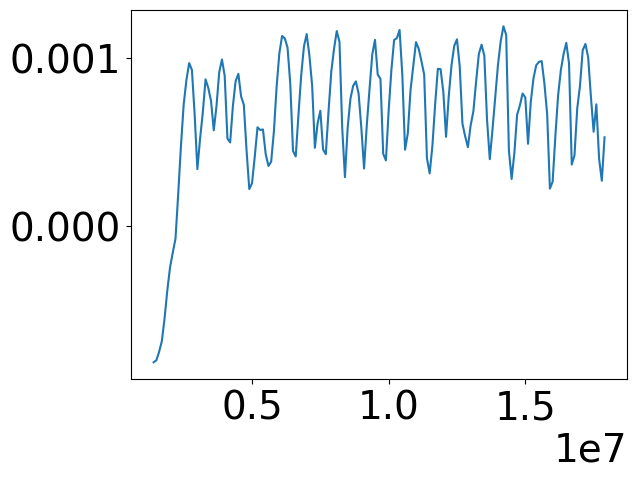

In [271]:
startbasin=int(wm/CellSize)
Cellsize=1000
timestep=1000
firstTimeStepsLimit=Within5percentMax #ensures that we only look for basin steady-state after orogenic steady-state is reached (within 10% of max)
basincelllength=len(zdataset.x.isel(x=slice(startbasin,-1)))
SteadystateHeightTHreshold=(1-np.exp(-1))

BasinB2_25_BasinSlope=xr.DataArray(((zdataset.topography__elevation.isel(out=slice(firstTimeStepsLimit,-1)).mean('y').isel(x=slice(startbasin,-2))).values-(zdataset.topography__elevation.isel(out=slice(firstTimeStepsLimit,-1)).mean('y').isel(x=slice(startbasin+1,-1))).values)/Cellsize,dims=['time','x'])

BasinB2_25_MeanSteadySlope_m_m=(BasinB2_25_BasinSlope.isel(x=slice(0,int(basincelllength))).mean('x').isel(time=slice(BasinB2_25_SteadyBasinApexStart,-1)).mean('time').values)
#BasinB2_25_MeanSteadySlope_degree=np.arctan(BasinB2_25_MeanSteadySlope_m_m*1000)#input must be in mm/m

MeanSlopeoverTime=BasinB2_25_BasinSlope.mean('x') #select basin only
StartConstantSteadyStateSlope=np.where((MeanSlopeoverTime[0:-2]-MeanSlopeoverTime[1:-1])<=(MeanSlopeoverTime[-1]*SteadystateHeightTHreshold))[0][0]



plt.plot(zdataset.out.isel(out=slice(firstTimeStepsLimit,-1)),MeanSlopeoverTime)
#plt.scatter(AgeSteadyState,MeanSlopeoverTime[StartConstantSlope], color='b')


print('Mean basin slope:', BasinB2_25_MeanSteadySlope_m_m)

In [107]:
# Stratigraphy

In [108]:
import Stratigraphy

StartBASIN=int(wm/CellSize)
ENDBASIN=-1

#Inputs for stratiProfiles Mean Y
XorY_StratiOverTime=zdataset.strati__elevation.isel(out2=-1).mean('y')#zdataset.strati__elevation.isel(out=-1).isel(y=MidBasin)
XorY_StratiOverTimeMeanY=np.asarray(XorY_StratiOverTime[:,StartBASIN:ENDBASIN])
Time_DistanceGridMeanY=np.asarray(np.tile(np.arange(int(XorY_StratiOverTimeMeanY.shape[1])), (int(XorY_StratiOverTimeMeanY.shape[0]), 1)))
XorY_GrainSizeOverTimeMeanY=np.asarray(zdataset.erosion__rate.mean('y')[:,StartBASIN:ENDBASIN])
# Strati function
StratiGS_LongProfileOverTimeMeanY=Stratigraphy.plotStratigraphy(XorY_StratiOverTimeMeanY,XorY_GrainSizeOverTimeMeanY)

fig = plt.figure(figsize=(18, 9))
a=np.arange(1,len(zdataset.x.isel(x=slice(StartBASIN,ENDBASIN)))+1)
plt.pcolormesh(Time_DistanceGridMeanY[:],XorY_StratiOverTimeMeanY[:],StratiGS_LongProfileOverTimeMeanY[:],cmap='RdYlBu')

plt.ylabel('Elevation (m)')
bottom=int(XorY_StratiOverTimeMeanY.min()-XorY_StratiOverTimeMeanY.max())
plt.ylim(bottom,250)
plt.xlabel('Downstream Distance (m)')
cbar=plt.colorbar()
cbar.set_label('Deposition/Erosion Rate m/yr', rotation=270, labelpad=50)
plt.clim(-0.0004,0.0004)
plt.rcParams.update({'font.size': 28})
#plt.savefig("ER_FlexureBest.pdf", format="pdf", bbox_inches="tight")

/var/folders/tb/39mwj8zx55l80qbywxxv98nm0000gp/T/ipykernel_2658/1035701799.py:16: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  plt.pcolormesh(Time_DistanceGridMeanY[:],XorY_StratiOverTimeMeanY[:],StratiGS_LongProfileOverTimeMeanY[:],cmap='RdYlBu')


In [140]:
# Topography is too cliff like. Add hillslope diffusion. Also adjust K to change the erodibility, topography height, and time to reach steady-state

## 2.1) Run the model again

### 2 Trial) Adjust and rerun: Hillslope Diffusion 

In [45]:
tf=18e6 #duration of fault activity
timestepbtw_simulation= 10000/2 #ranges between 1000-50000 year time scales. #No set rule for this.
ntime=int(tf/timestepbtw_simulation)+1
timestepbtw_output=100000
nout=int(tf/timestepbtw_output)+1
print('Number of time steps:',tf/timestepbtw_simulation)

Number of time steps: 3600.0


In [46]:
s0*6/8

0.000375

In [47]:
# Uplift
s0=0.0005
u0=s0*6/8# 0.0001666-0.0003333 (one to two thirds the subsidence rate)
alpha=2.2 #2-2.5 #increase alpha since I made the basin longer
U = xr.DataArray(np.where(x<wm, u0, -s0*np.exp(-(x-wm)/wb*alpha)),dims=['y','x'])


In [303]:
u0

0.0003333333333333333

In [161]:
# %create_setup model --default --verbose
import xsimlab as xs

ds_in = xs.create_setup(
    model=model,
    clocks={'time': np.linspace(0,tf,ntime),
           'out': np.linspace(0,tf,nout),
            'out2': np.linspace(tf-timestepbtw_output,tf,1)},
    master_clock = 'time',
    input_vars={
        # nb. of grid nodes in (y, x)
        'grid__shape': [ny,nx],
        # total grid length in (y, x)
        'grid__length': [yl,xl],
        # node status at borders
        'boundary__status': Boundary,
        # uplift rate
        'uplift__rate': U,
        # MFD partioner slope exponent
        'flow__slope_exp': 1.0,
        # drainage area exponent
        'spl__area_exp': 0.4,
        # slope exponent
        'spl__slope_exp': 1,
        # relative tolerance (Gauss-Siedel convergence)
        'spl__tol_rel': 0.0001,
        # absolute tolerance (Gauss-Siedel convergence)
        'spl__tol_abs': 0.0001,
        # max nb. of iterations (Gauss-Siedel convergence)
        'spl__max_iter': 100,
        # bedrock channel incision coefficient
        'spl__k_coef_bedrock': 1.5e-5,
        # soil (sediment) channel incision coefficient
        'spl__k_coef_soil': 2e-5, #higher k_f is generally more erodible. 
        # detached bedrock transport/deposition coefficient
        'spl__g_coef_bedrock': 0.7, #transport limited (G over 0.4 with sufficient sediment). Mediam 0.7 from Guerit et al. (2019)?
        # soil (sediment) transport/deposition coefficient
        'spl__g_coef_soil': 1,
        # bedrock diffusivity
        'diffusion__diffusivity_bedrock': 3e-2, #varies depends on your spatial grid resolution! This will change your slopes between the channels in the mountain area. 
        #3e-3 m^2yr^1 at the 10 m scale. Bump up diffusitivty coefficent an order of magnitude for each change in grid magnitude. Cell=100m then diffusivity=3e-2.
        # soil (sediment) diffusivity
        'diffusion__diffusivity_soil': 3e-2,
        # surface topography elevation
        'topography__elevation': h0,
        'strati__freeze_time': np.linspace(0,tf,nout),
        'gsize__D0': 1, 
        # The bedrock source grain size standard deviation
        'gsize__SD0': 0.75,
        # Cv (grain size calculation constant) described in Fedele and Paola (2007) and Duller
        # et al. (2010)
        'gsize__Cv': 0.75,
        # C1 (grain size calculation constant) described in Fedele and Paola (2007) and Duller
        # et al. (2010)
        'gsize__C1': 0.75,
        # Porosity
        'gsize__porosity': 0,
        
        
    },
    output_vars={'topography__elevation': 'out',
                 'bedrock__elevation': 'out',
                 'drainage__flowacc': 'out',
                 'erosion__rate': 'out',
                 'gsize__EFlux': 'out',
                 'gsize__Age': 'out',
                 "strati__elevation": "out2", #only need the final time step
                }
)


In [162]:
#zgroup = zarr.group("DeathValleyMountain2.zarr", overwrite=True)

In [163]:
with model, xs.monitoring.ProgressBar():
    ds_out = (ds_in.xsimlab.run(model=model, store=zgroup))

             0% | initialize 

In [48]:
zdataset = xr.open_zarr('DeathValleyMountain2.zarr').set_index()

zdataset.x.attrs["units"] = "m"
zdataset.y.attrs["units"] = "m"
zdataset.out.attrs["units"] = "years"
zdataset.out2.attrs["units"] = "years"
startbasin=int(wm/CellSize)

aspects= 1#If 2, x direction will be twice as long as y. #xl/yl
sizes= 8

In [207]:
#Take a look at basin 2
from ipyfastscape import TopoViz3d

app = TopoViz3d(zdataset, canvas_height=600, time_dim="out")

app.components['background_color'].set_color('lightgray')
app.components['vertical_exaggeration'].set_factor(5)
app.components['timestepper'].go_to_time(zdataset.out[-1])

app.show()

/Users/awild/opt/anaconda3/envs/workshop-itn-potsdam-2023-01/lib/python3.10/site-packages/ipyfastscape/xr_accessor.py:73: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  return self._dataset.indexes[self.time_dim].get_loc(time, method='nearest')


Output(layout=Layout(height='640px'))

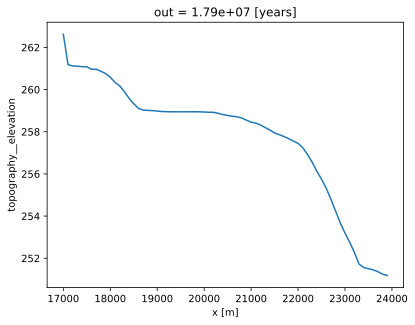

In [51]:
zdataset.topography__elevation.mean('y').isel(x=slice(int(wm/CellSize),-1)).isel(out=-2).plot()

## Trial 3) Precip controlling Fan Extent

In [ ]:
# Add precip differentiation between upstream catchment and downstream to control fan extent. 

In [67]:
#Oscillate Precip over time (with the option for irragular intervals)
from fastscape.processes import FlowAccumulator
model=model.update_processes({'drainage': FlowAccumulator})

CatchmentPrecip1=0.5
BasinPrecip=0.85

time = np.linspace(0, tf, ntime)
pr = xr.DataArray(np.where(
    (x[np.newaxis,:, :]<wm)&
    (time[:,np.newaxis,np.newaxis] <=tf),
    CatchmentPrecip1,BasinPrecip),
                  dims=['time','y','x'])

In [ ]:
# %create_setup model --default --verbose
import xsimlab as xs

ds_in = xs.create_setup(
    model=model,
    clocks={'time': np.linspace(0,tf,ntime),
           'out': np.linspace(0,tf,nout),
            'out2': np.linspace(tf-timestepbtw_output,tf,1)},
    master_clock = 'time',
    input_vars={
        # nb. of grid nodes in (y, x)
        'grid__shape': [ny,nx],
        # total grid length in (y, x)
        'grid__length': [yl,xl],
        # node status at borders
        'boundary__status': Boundary,
        # uplift rate
        'uplift__rate': U,
        # MFD partioner slope exponent
        'flow__slope_exp': 1.0,
        # drainage area exponent
        'spl__area_exp': 0.4,
        # slope exponent
        'spl__slope_exp': 1,
        # relative tolerance (Gauss-Siedel convergence)
        'spl__tol_rel': 0.0001,
        # absolute tolerance (Gauss-Siedel convergence)
        'spl__tol_abs': 0.0001,
        # max nb. of iterations (Gauss-Siedel convergence)
        'spl__max_iter': 100,
        # bedrock channel incision coefficient
        'spl__k_coef_bedrock': 1.5e-5,
        # soil (sediment) channel incision coefficient
        'spl__k_coef_soil': 2e-5, #higher k_f is generally more erodible. 
        # detached bedrock transport/deposition coefficient
        'spl__g_coef_bedrock': 0.7, #transport limited (G over 0.4 with sufficient sediment). Mediam 0.7 from Guerit et al. (2019)?
        # soil (sediment) transport/deposition coefficient
        'spl__g_coef_soil': 1,
        # bedrock diffusivity
        'diffusion__diffusivity_bedrock': 3e-2, #varies depends on your spatial grid resolution! This will change your slopes between the channels in the mountain area. 
        #3e-3 m^2yr^1 at the 10 m scale. Bump up diffusitivty coefficent an order of magnitude for each change in grid magnitude. Cell=100m then diffusivity=3e-2.
        # soil (sediment) diffusivity
        'diffusion__diffusivity_soil': 3e-2,
        # surface topography elevation
        'topography__elevation': h0,
        'strati__freeze_time': np.linspace(0,tf,nout),
        'gsize__D0': 1, 
        # The bedrock source grain size standard deviation
        'gsize__SD0': 0.8,
        # Cv (grain size calculation constant) described in Fedele and Paola (2007) and Duller
        # et al. (2010)
        'gsize__Cv': 0.8,
        # C1 (grain size calculation constant) described in Fedele and Paola (2007) and Duller
        # et al. (2010)
        'gsize__C1': 0.7,
        # Porosity
        'gsize__porosity': 0,
        'drainage__runoff': pr,
        
        
    },
    output_vars={'topography__elevation': 'out',
                 'bedrock__elevation': 'out',
                 'drainage__flowacc': 'out',
                 'erosion__rate': 'out',
                 'gsize__EFlux': 'out',
                 'gsize__Age': 'out',
                 "strati__elevation": "out2", #only need the final time step
                }
)


In [ ]:
zgroup = zarr.group("DeathValleyMountain_wSpatialPrecip.zarr", overwrite=True)

In [ ]:
with model, xs.monitoring.ProgressBar():
    ds_out = (ds_in.xsimlab.run(model=model, store=zgroup))

In [68]:
zdataset = xr.open_zarr('DeathValleyMountain_wSpatialPrecip.zarr').set_index()

zdataset.x.attrs["units"] = "m"
zdataset.y.attrs["units"] = "m"
zdataset.out.attrs["units"] = "years"
zdataset.out2.attrs["units"] = "years"
startbasin=int(wm/CellSize)

aspects= 1#If 2, x direction will be twice as long as y. #xl/yl
sizes= 8

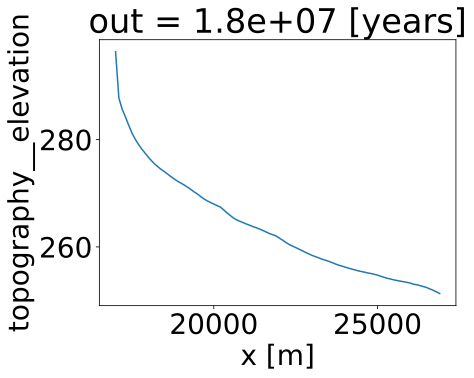

In [69]:
zdataset.topography__elevation.isel(x=slice(startbasin,-1)).isel(out=-1).mean('y').plot()

## 4.1) Best Run of this Notebook (Still room for improvement, but we are better matching the data)

### Trial 4) Increase K.

In [342]:
# Notebooks 4 and 5 will take off (model further) based on the inputs from this simulation that initially best matched the fan topography. 

In [ ]:
# %create_setup model --default --verbose
import xsimlab as xs

ds_in = xs.create_setup(
    model=model,
    clocks={'time': np.linspace(0,tf,ntime),
           'out': np.linspace(0,tf,nout),
            'out2': np.linspace(tf-timestepbtw_output,tf,1)},
    master_clock = 'time',
    input_vars={
        # nb. of grid nodes in (y, x)
        'grid__shape': [ny,nx],
        # total grid length in (y, x)
        'grid__length': [yl,xl],
        # node status at borders
        'boundary__status': Boundary,
        # uplift rate
        'uplift__rate': U,
        # MFD partioner slope exponent
        'flow__slope_exp': 1.0,
        # drainage area exponent
        'spl__area_exp': 0.4, #m
        # slope exponent
        'spl__slope_exp': 1, #N
        # relative tolerance (Gauss-Siedel convergence)
        'spl__tol_rel': 0.0001,
        # absolute tolerance (Gauss-Siedel convergence)
        'spl__tol_abs': 0.0001,
        # max nb. of iterations (Gauss-Siedel convergence)
        'spl__max_iter': 100,
        # bedrock channel incision coefficient
        'spl__k_coef_bedrock': 1.5e-5*2,
        # soil (sediment) channel incision coefficient
        'spl__k_coef_soil': 2e-5*2, #higher k_f is generally more erodible. 
        # detached bedrock transport/deposition coefficient
        'spl__g_coef_bedrock': 0.7, #transport limited (G over 0.4 with sufficient sediment). Mediam 0.7 from Guerit et al. (2019)?
        # soil (sediment) transport/deposition coefficient
        'spl__g_coef_soil': 1,
        # bedrock diffusivity
        'diffusion__diffusivity_bedrock': 3e-2, #varies depends on your spatial grid resolution! This will change your slopes between the channels in the mountain area. 
        #3e-3 m^2yr^1 at the 10 m scale. Bump up diffusitivty coefficent an order of magnitude for each change in grid magnitude. Cell=100m then diffusivity=3e-2.
        # soil (sediment) diffusivity
        'diffusion__diffusivity_soil': 3e-2,
        # surface topography elevation
        'topography__elevation': h0,
        'strati__freeze_time': np.linspace(0,tf,nout),
        'gsize__D0': 1, 
        # The bedrock source grain size standard deviation
        'gsize__SD0': 0.8, # Grain size inputs described for the Grapevine fans in Darcy et al. 2017
        # Cv (grain size calculation constant) described in Fedele and Paola (2007) and Duller
        # et al. (2010)
        'gsize__Cv': 0.8, # Grain size inputs described for the Grapevine fans in Darcy et al. 2017
        # C1 (grain size calculation constant) described in Fedele and Paola (2007) and Duller
        # et al. (2010)
        'gsize__C1': 0.7, # Grain size inputs described for the Grapevine fans in Darcy et al. 2017
        # Porosity
        'gsize__porosity': 0,
        'drainage__runoff': pr,
        
        
    },
    output_vars={'topography__elevation': 'out',
                 'bedrock__elevation': 'out',
                 'drainage__flowacc': 'out',
                 'erosion__rate': 'out',
                 'gsize__EFlux': 'out',
                 'gsize__DMean': 'out',
                 'gsize__DTIME': 'out',
                 'gsize__D0Source': 'out',
                 'gsize__Age': 'out',
                 "strati__elevation": "out2", #only need the final time step
                }
)


In [ ]:
zgroup = zarr.group("DeathValleyMountain_wSpatialPrecip_increaseK.zarr", overwrite=True)

In [ ]:
with model, xs.monitoring.ProgressBar():
    ds_out = (ds_in.xsimlab.run(model=model, store=zgroup))

In [309]:
zdataset = xr.open_zarr('DeathValleyMountain_wSpatialPrecip_increaseK.zarr').set_index()

zdataset.x.attrs["units"] = "m"
zdataset.y.attrs["units"] = "m"
zdataset.out.attrs["units"] = "years"
zdataset.out2.attrs["units"] = "years"
startbasin=int(wm/CellSize)

aspects= 1#If 2, x direction will be twice as long as y. #xl/yl
sizes= 8

## 4.2) Plot best Outputs 

In [298]:
#Slope looks right, but is still too low. Could try increasing uplift, further increasing K, reducing subsidence, or reducing model width?
# Try reducing model with to only 1-3 fans...

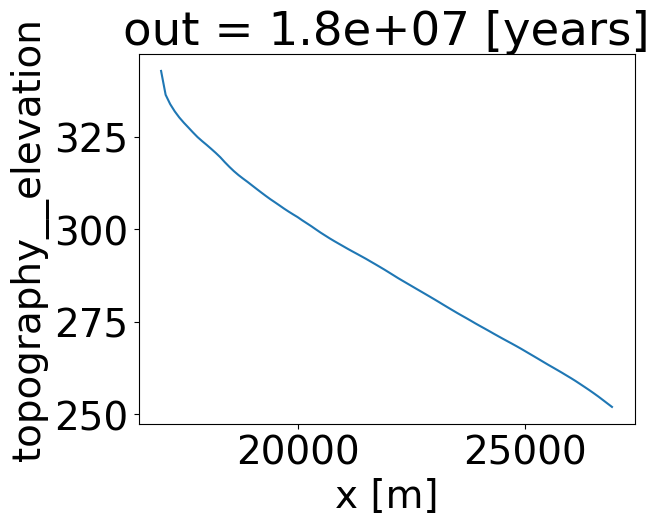

In [299]:
zdataset.topography__elevation.isel(x=slice(startbasin,-1)).isel(out=-1).mean('y').plot()

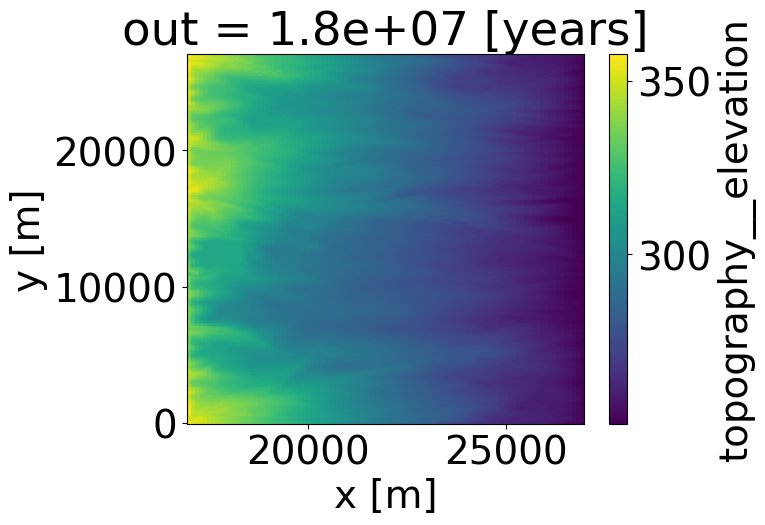

In [31]:
zdataset.topography__elevation.isel(out=-1).isel(x=slice(startbasin,-1)).plot()

Orogenic Steady-State Reached after 0.8 Myrs
Mean Steady-State Height at 547.51 m


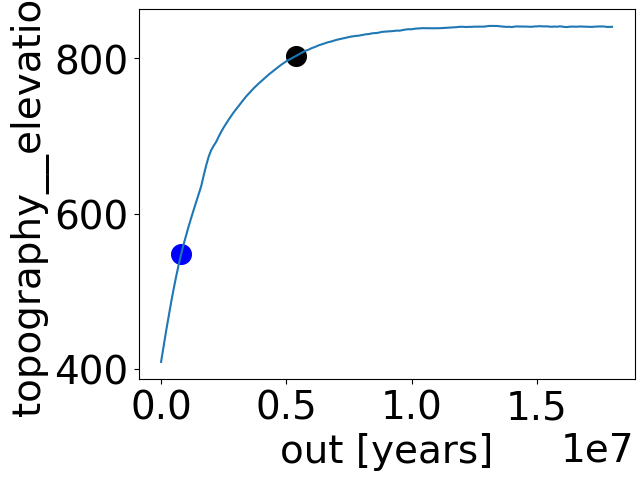

In [294]:
#Orogenic Steady-State

#timestepbtw_output=10000 #yrs
SteadystateHeightTHreshold=(1-np.exp(-1))

MountainMeanHeight=zdataset.topography__elevation.isel(x=slice(0,startbasin)).mean('y').mean('x')

SteadyMountainStartHeight= (MountainMeanHeight.max('out').values*SteadystateHeightTHreshold) #Steady state is defined as when the topographic height reaches 63% of the mean topographic maximum over time. 

SteadyMountainStart=np.where(MountainMeanHeight>=SteadyMountainStartHeight)[0][0]
ActualSteadyMax=MountainMeanHeight.max('out').values
Within5percentMax=np.where(MountainMeanHeight>=ActualSteadyMax*0.95)[0][0]

print('Orogenic Steady-State Reached after',zdataset.out[SteadyMountainStart].values/1e6, "Myrs")
print('Mean Steady-State Height at',round(float(zdataset.topography__elevation.mean('y').mean('x')[SteadyMountainStart].values),2), "m")


zdataset.topography__elevation.mean('y').mean('x').plot()
plt.scatter(zdataset.out[SteadyMountainStart],zdataset.topography__elevation.mean('y').mean('x')[SteadyMountainStart],color='b',s=200)

plt.scatter(zdataset.out[Within5percentMax],zdataset.topography__elevation.mean('y').mean('x')[Within5percentMax],color='k',s=200)

In [295]:
# Basin Steady-State

Basin Steady-State Reached after 5.4 Myrs


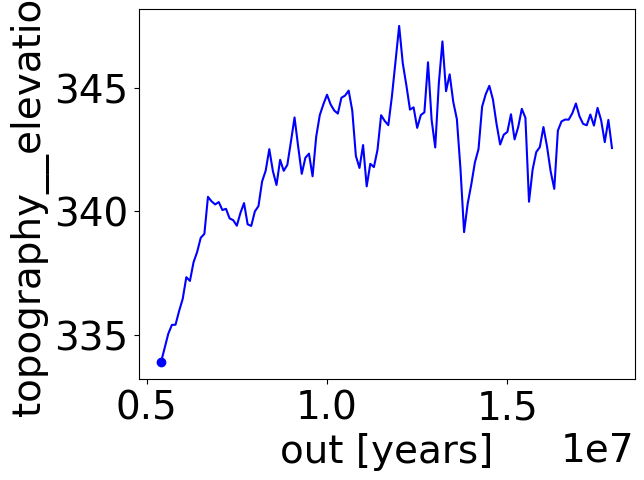

In [300]:
startbasin=int(wm/CellSize)
Cellsize=1000
timestep=1000
firstTimeStepsLimit=Within5percentMax  #ensures that we only look for basin steady-state after orogenic steady-state is reached (within 10% of max)
RoughExtentofFan=-1 #whole simulation

SteadystateHeightTHreshold=(1-np.exp(-1))
basincelllength=len(zdataset.x.isel(x=slice(startbasin,-1)))

BasinB2_25_BasinApex=zdataset.topography__elevation.isel(out=slice(firstTimeStepsLimit,-1)).mean('y').isel(x=slice(startbasin,-1)).max('x') #Capture the fan apex over time
#
BasinB2_25_SteadyBasinApexStartHeight= (BasinB2_25_BasinApex.max('out').values*SteadystateHeightTHreshold) #Steady state is defined as when the topographic height reaches 63% of the mean topographic maximum over time. 
BasinB2_25_SteadyBasinApexStart=np.where(BasinB2_25_BasinApex>=BasinB2_25_SteadyBasinApexStartHeight)[0][0]

print('Basin Steady-State Reached after',zdataset.out.isel(out=slice(firstTimeStepsLimit,-1))[BasinB2_25_SteadyBasinApexStart].values/1e6, "Myrs")

BasinB2_25_BasinApex.plot(color='b')
plt.scatter(zdataset.isel(out=slice(firstTimeStepsLimit,-1)).out[BasinB2_25_SteadyBasinApexStart],BasinB2_25_BasinApex[BasinB2_25_SteadyBasinApexStart],color='b')



In [89]:
#Fluxes
#To get flux per year divide by the timestep between your simulations
Flux=(zdataset.gsize__EFlux*(CellSize*CellSize)) #m^3/yr
#Flux=(zdataset.gsize__EFlux)
MeanFluxMountain=Flux.isel(x=int(wm/CellSize)).isel(out=slice(-int(nout*1/4),-1)).mean('y').mean('out').values #m^3/yr 
#select the flux in the dominant channel
#
#select the main channel
max_drainage_indices = xr.DataArray(zdataset.drainage__flowacc.argmax('y')).load()
ChannelTopo=zdataset.topography__elevation.sel(y=zdataset.y[max_drainage_indices]);
ChannelFlux=Flux.sel(y=zdataset.y[max_drainage_indices]);

(MeanFluxMountain/1e6)/1e9 #m^3/Myr

3.328220840214074e-11

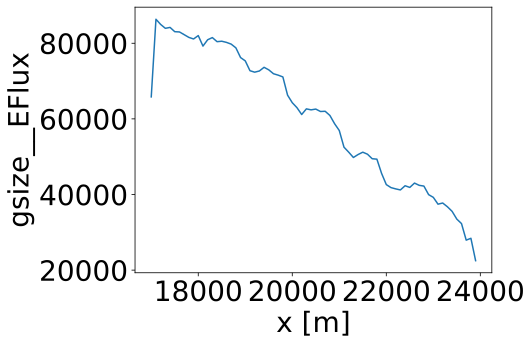

In [91]:
ChannelFlux.isel(out=slice(int((len(zdataset.out)-1)*1/4),-1)).mean('out').isel(x=slice(int(wm/CellSize),-1)).plot()

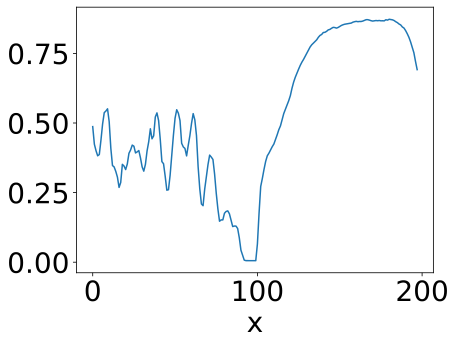

In [76]:
#Local Minima
BasinTopo=zdataset.topography__elevation.isel(x=slice(int(wb/CellSize),-1))
DownBasinSlope=((BasinTopo.isel(x=slice(0,-2)).values)-(BasinTopo.isel(x=slice(1,-1)).values))/CellSize
BinaryMinima=xr.DataArray(np.where(DownBasinSlope<0.01,1,0),dims=['time','y','x'])
MinimaFrequency=BinaryMinima.sum('y').sum('time')/(len(zdataset.out)-1)/len(zdataset.y)
MinimaFrequency.plot()

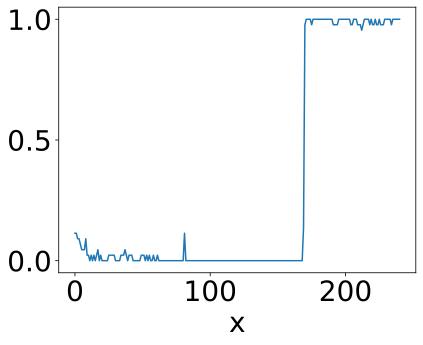

In [77]:
import DominantChannelDynamics as channel



a=xr.DataArray(channel.AvulsionMainChannel(Binary,DominantDrainage_YPath),dims=['time','y','x'])
sumAvulsion_overtimeperiod=a.max('y').isel(time=slice(-int(nout*1/4),-1)).sum('time')
timeInterval_minus1=int(nout*1/4)-1

AvulsionFrequency=sumAvulsion_overtimeperiod/timeInterval_minus1

AvulsionFrequency.plot()

In [29]:
# Grain Size

(0.0, 1.0)

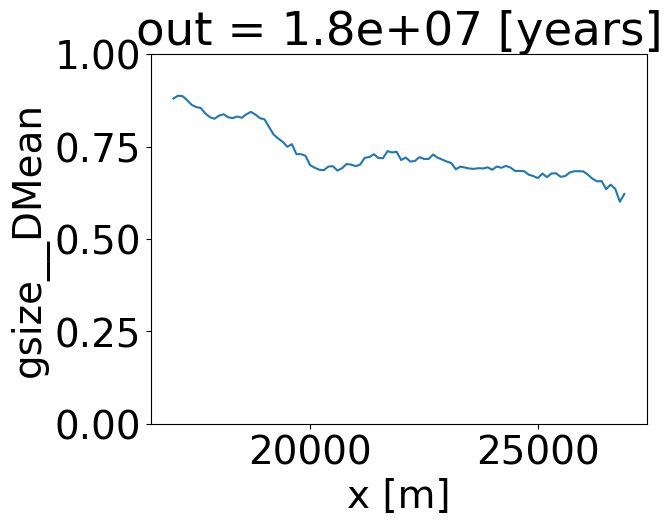

In [30]:
zdataset.gsize__DMean.isel(x=slice(startbasin,-1)).isel(out=-1).mean('y').plot()
plt.ylim(0,1)

In [ ]:
# Age Surface

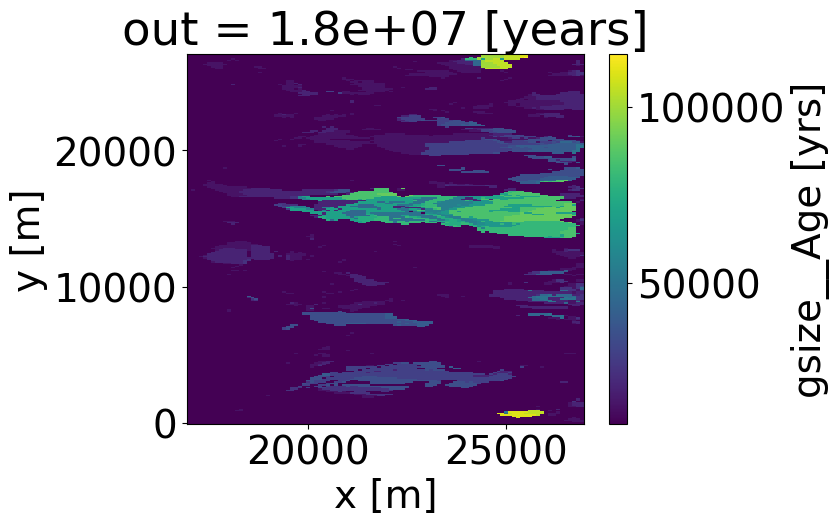

In [324]:
(zdataset.out.isel(out=-1).values-zdataset.gsize__Age.isel(out=-1).isel(x=slice(startbasin,-1))).plot()
#Final model time - model age at the surface to get how old the surfaces are since the final (-1) time step.
 

In [341]:
#You can plot different surfaces through time in a for loop.


# fig, ax=plt.subplots(nrows=2, ncols=5)
# for i in range(0,len(zdataset.out),18):
#     if i==0:
#         count1=0
#         count2=0
#     if i<100:
#         count1=0
#         ax[count1,count2].imshow((zdataset.out.isel(out=i).values-zdataset.gsize__Age.isel(out=i).isel(x=slice(startbasin,-1))))
#         count2=count2+1
#     if (count2)==5:
#         count2=0
#     if i>100:
#         count1=1
#         ax[count1,count2].imshow((zdataset.out.isel(out=i).values-zdataset.gsize__Age.isel(out=i).isel(x=slice(startbasin,-1))))
#         count2=count2+1



#### Stratigraphy

In [27]:
import Stratigraphy

StartBASIN=int(wm/CellSize)
ENDBASIN=-1

#Inputs for stratiProfiles Mean Y
XorY_StratiOverTime=zdataset.strati__elevation.isel(out2=-1).mean('y')#zdataset.strati__elevation.isel(out=-1).isel(y=MidBasin)
XorY_StratiOverTimeMeanY=np.asarray(XorY_StratiOverTime[:,StartBASIN:ENDBASIN])
Time_DistanceGridMeanY=np.asarray(np.tile(np.arange(int(XorY_StratiOverTimeMeanY.shape[1])), (int(XorY_StratiOverTimeMeanY.shape[0]), 1)))
XorY_GrainSizeOverTimeMeanY=np.asarray(zdataset.erosion__rate.mean('y')[:,StartBASIN:ENDBASIN])
# Strati function
StratiGS_LongProfileOverTimeMeanY=Stratigraphy.plotStratigraphy(XorY_StratiOverTimeMeanY,XorY_GrainSizeOverTimeMeanY)

In [82]:
fig = plt.figure(figsize=(18, 9))
a=np.arange(1,len(zdataset.x.isel(x=slice(StartBASIN,ENDBASIN)))+1)
plt.pcolormesh(Time_DistanceGridMeanY[:],XorY_StratiOverTimeMeanY[:],StratiGS_LongProfileOverTimeMeanY[:],cmap='RdYlBu')

plt.ylabel('Elevation (m)')
bottom=int(XorY_StratiOverTimeMeanY.min()-XorY_StratiOverTimeMeanY.max())
plt.ylim(bottom,250)
plt.xlabel('Downstream Distance (m)')
cbar=plt.colorbar()
cbar.set_label('Deposition/Erosion Rate m/yr', rotation=270, labelpad=50)
plt.clim(-0.0004,0.0004)
plt.rcParams.update({'font.size': 28})
#plt.savefig("ER_FlexureBest.pdf", format="pdf", bbox_inches="tight")

/var/folders/tb/39mwj8zx55l80qbywxxv98nm0000gp/T/ipykernel_2658/1219548741.py:3: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  plt.pcolormesh(Time_DistanceGridMeanY[:],XorY_StratiOverTimeMeanY[:],StratiGS_LongProfileOverTimeMeanY[:],cmap='RdYlBu')


In [121]:
# Grain Size

In [120]:
import Stratigraphy

StartBASIN=int(wm/CellSize)
ENDBASIN=-1

#Inputs for stratiProfiles Mean Y
XorY_StratiOverTime=zdataset.strati__elevation.isel(out2=-1).isel(y=10)#zdataset.strati__elevation.isel(out=-1).isel(y=MidBasin)
XorY_StratiOverTimeMeanY=np.asarray(XorY_StratiOverTime[:,StartBASIN:ENDBASIN])
Time_DistanceGridMeanY=np.asarray(np.tile(np.arange(int(XorY_StratiOverTimeMeanY.shape[1])), (int(XorY_StratiOverTimeMeanY.shape[0]), 1)))
XorY_GrainSizeOverTimeMeanY=np.asarray(zdataset.gsize__DTIME.isel(y=10)[:,StartBASIN:ENDBASIN])
# Strati function
StratiGS_LongProfileOverTimeMeanY=Stratigraphy.plotStratigraphy(XorY_StratiOverTimeMeanY,XorY_GrainSizeOverTimeMeanY)

fig = plt.figure(figsize=(18, 9))
a=np.arange(1,len(zdataset.x.isel(x=slice(StartBASIN,ENDBASIN)))+1)
plt.pcolormesh(Time_DistanceGridMeanY[:],XorY_StratiOverTimeMeanY[:],StratiGS_LongProfileOverTimeMeanY[:])

plt.ylabel('Elevation (m)')
bottom=int(XorY_StratiOverTimeMeanY.min()-XorY_StratiOverTimeMeanY.max())
plt.ylim(bottom,250)
plt.xlabel('Downstream Distance (m)')
cbar=plt.colorbar()
cbar.set_label('Dimensionless Grain Size', rotation=270, labelpad=50)
plt.clim(0,1)
plt.rcParams.update({'font.size': 28})
#plt.savefig("ER_FlexureBest.pdf", format="pdf", bbox_inches="tight")

/var/folders/tb/39mwj8zx55l80qbywxxv98nm0000gp/T/ipykernel_2658/2985125100.py:16: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  plt.pcolormesh(Time_DistanceGridMeanY[:],XorY_StratiOverTimeMeanY[:],StratiGS_LongProfileOverTimeMeanY[:])


In [16]:
# Save the down basin age stratigraphy for the last 1 Myr and top 400m at every 10th location moving across the basin

In [304]:
# don't forget to import stratigraphy

In [306]:
int(len(zdataset.out)/10)

18

/var/folders/tb/39mwj8zx55l80qbywxxv98nm0000gp/T/ipykernel_7196/859204888.py:15: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  plt.pcolormesh(Time_DistanceGridMeanY[:],XorY_StratiOverTimeMeanY[:],StratiGS_LongProfileOverTimeMeanY[:],cmap='RdYlBu')
/var/folders/tb/39mwj8zx55l80qbywxxv98nm0000gp/T/ipykernel_7196/859204888.py:15: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  plt.pcolormesh(Time_DistanceGridMeanY[:],XorY_StratiOverTimeMeanY[:],StratiGS_LongProfileOverTimeMeanY[:],cmap='RdYlBu')
/var/folders/tb/39mwj8zx55l80qbywxxv98nm0000gp/T/ipykernel_7196/859204888.py:15: UserWarning

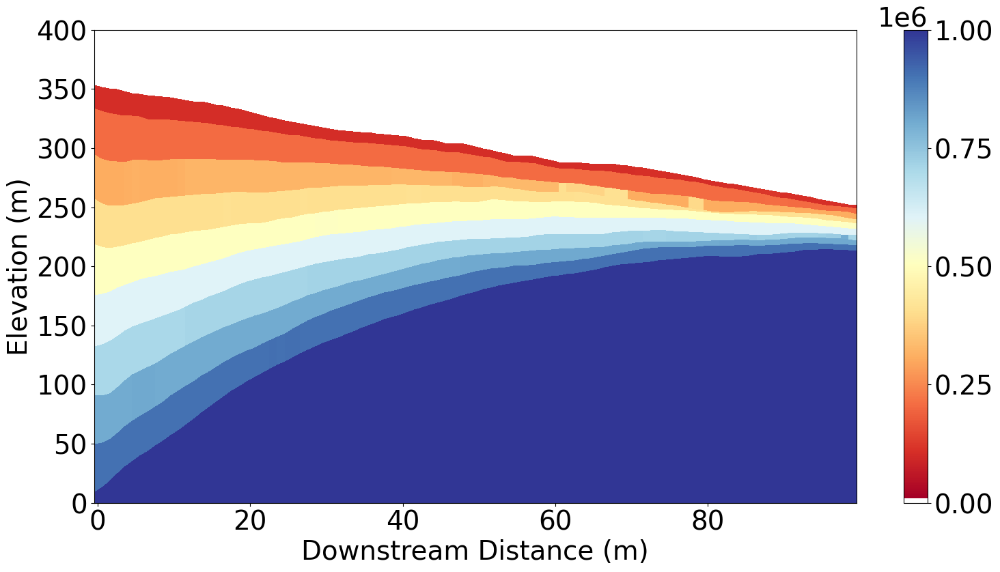

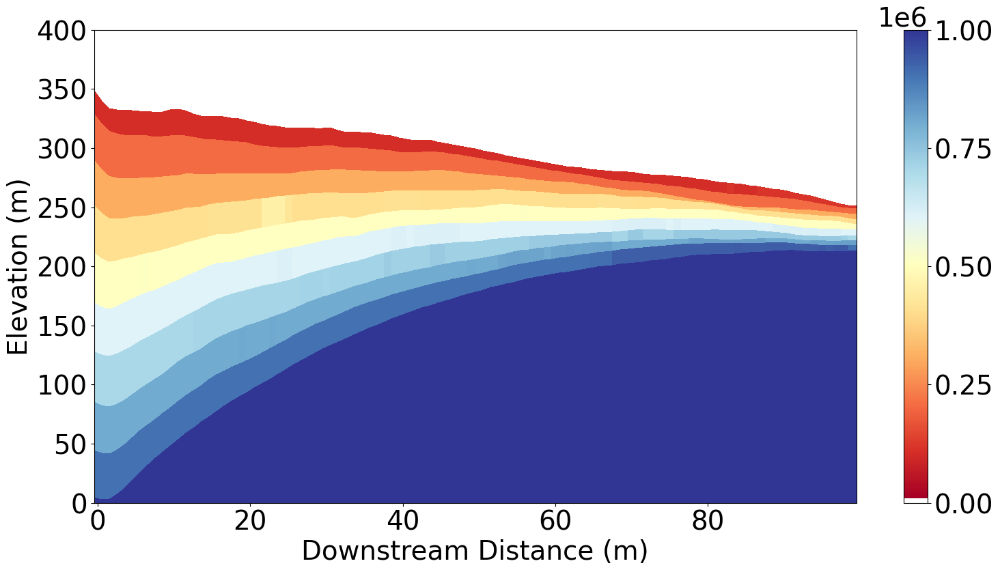

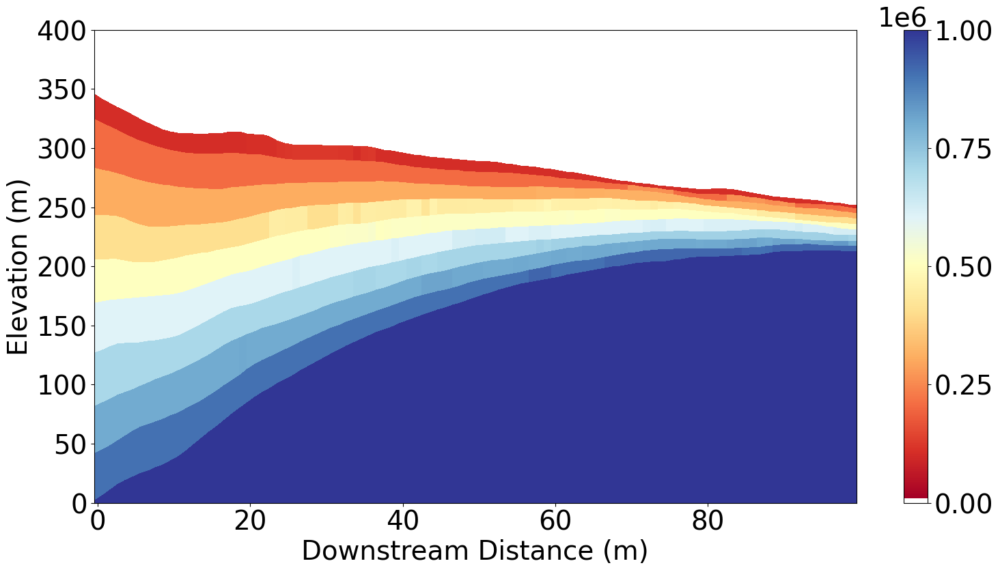

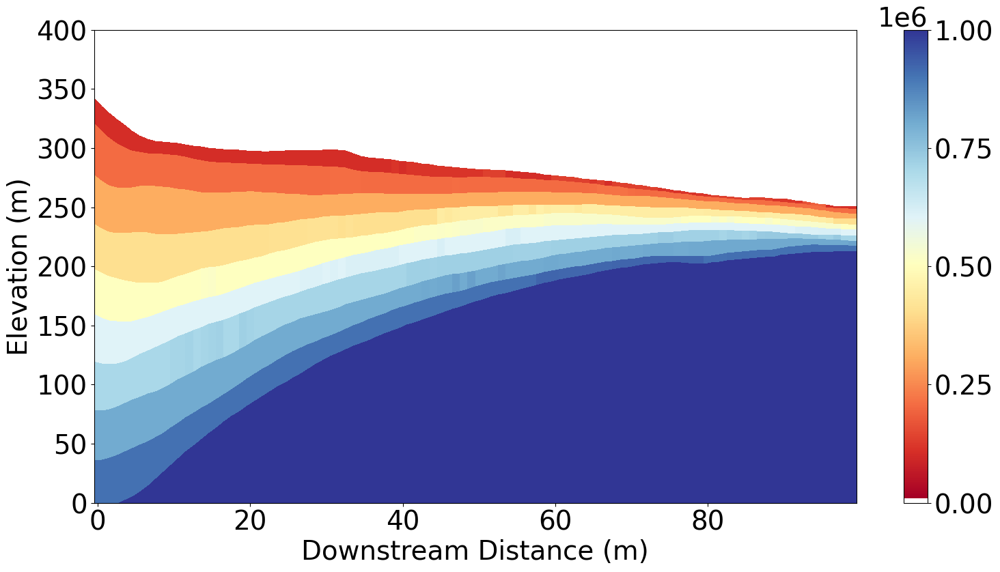

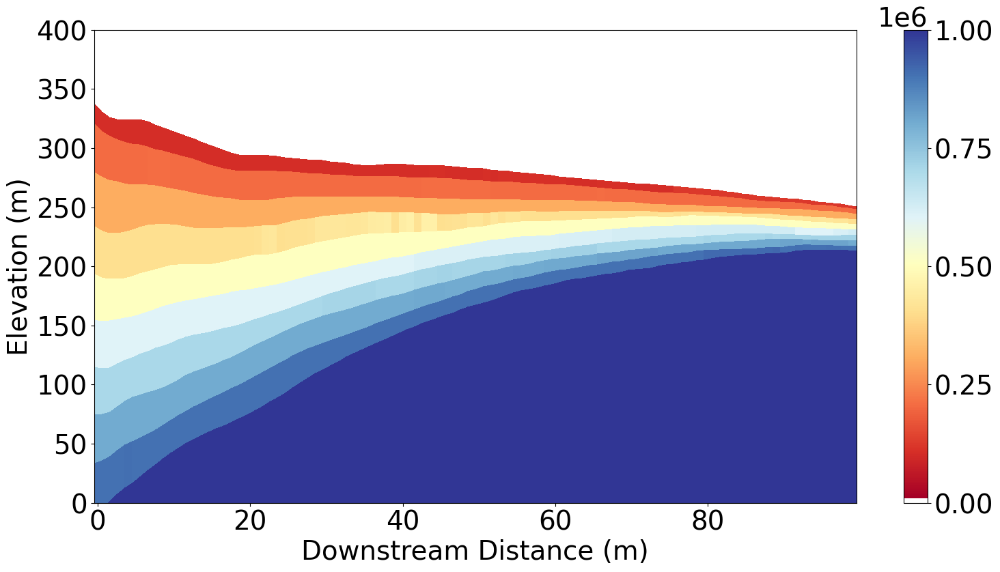

...

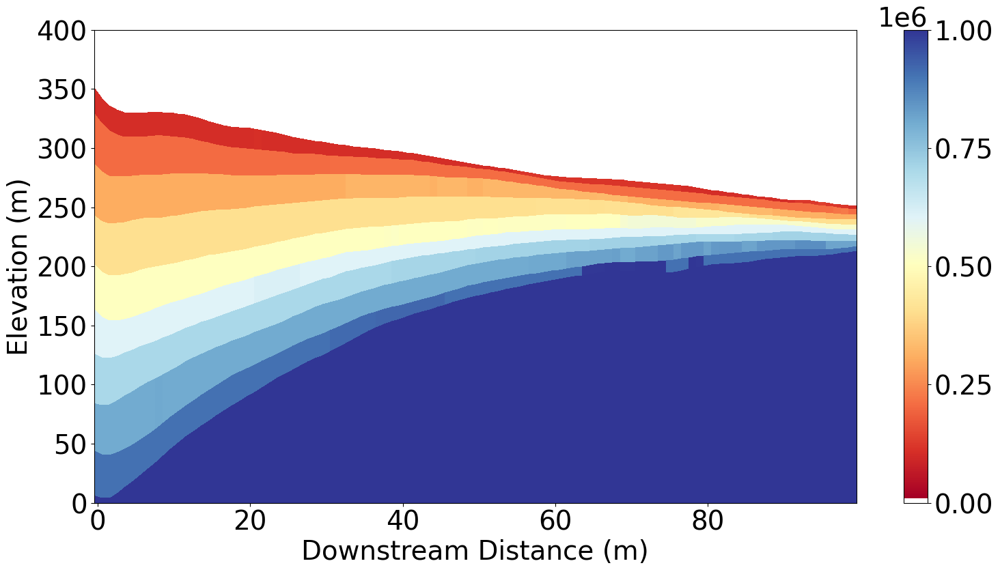

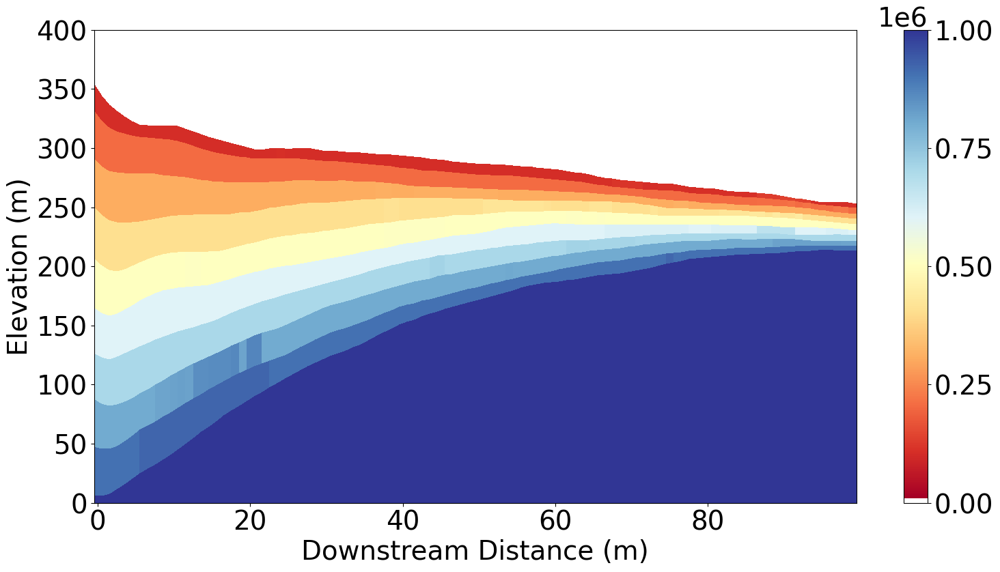

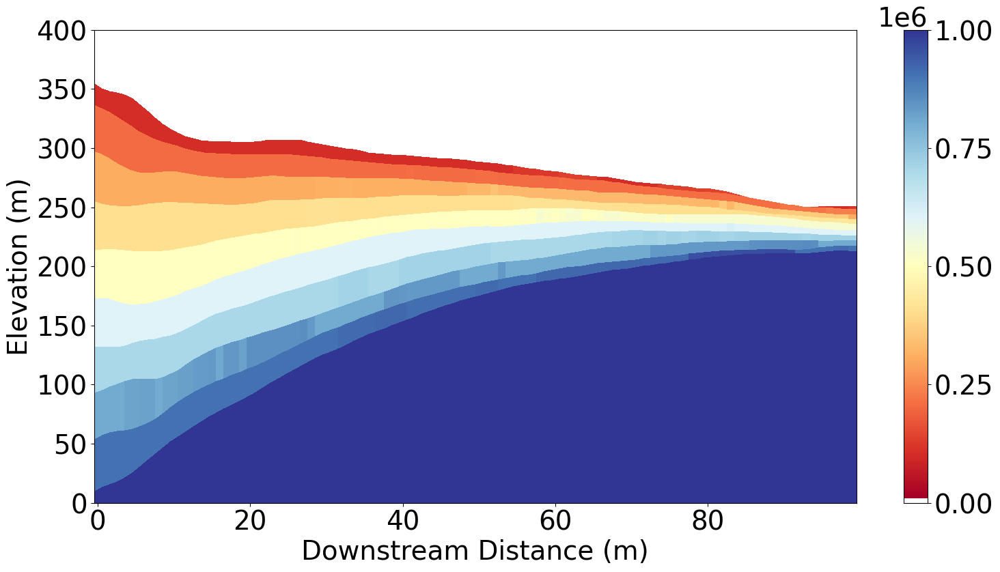

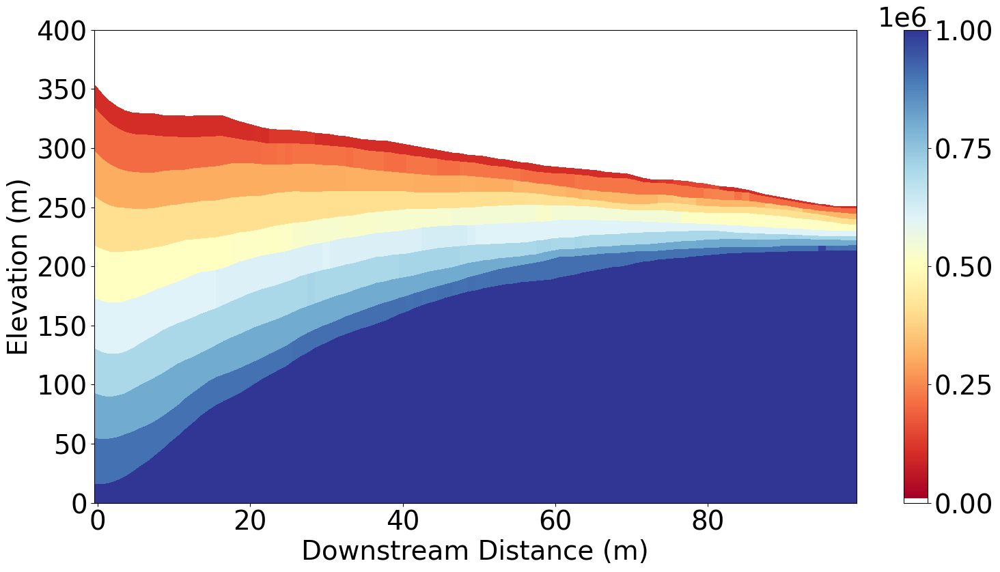

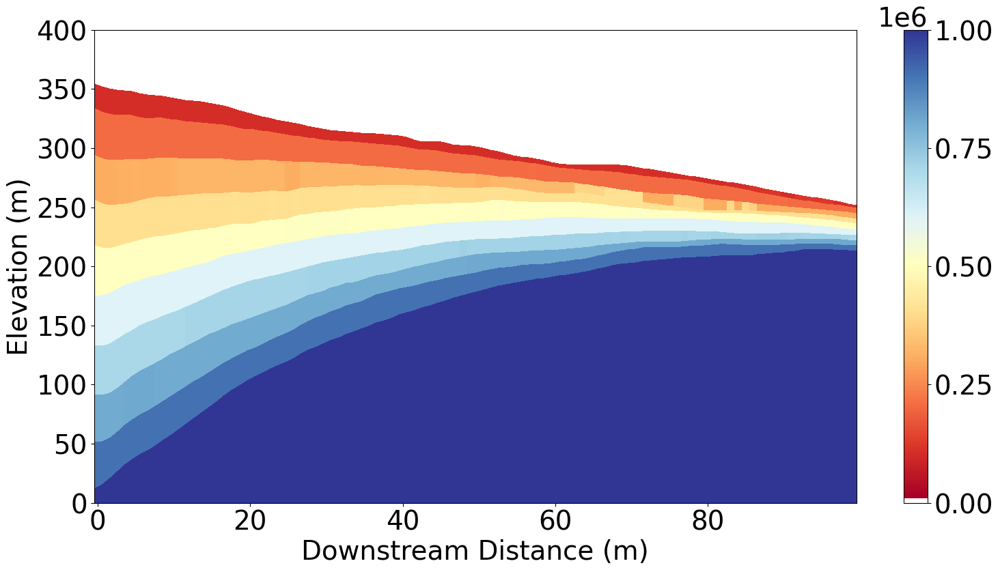

In [301]:
StartBASIN=int(wm/CellSize)
ENDBASIN=-1
for i in range(0,len(zdataset.y),int(len(zdataset.out)/10)): #print every 10th areas moving across the basin
    
    #Inputs for stratiProfiles Mean Y
    #Inputs for stratiProfiles Mean Y
    XorY_StratiOverTime=zdataset.strati__elevation.isel(out2=-1).isel(y=i)#zdataset.strati__elevation.isel(out=-1).isel(y=MidBasin)
    XorY_StratiOverTimeMeanY=np.asarray(XorY_StratiOverTime[:,StartBASIN:ENDBASIN])
    Time_DistanceGridMeanY=np.asarray(np.tile(np.arange(int(XorY_StratiOverTimeMeanY.shape[1])), (int(XorY_StratiOverTimeMeanY.shape[0]), 1)))
    XorY_GrainSizeOverTimeMeanY=np.asarray(zdataset.out.isel(out=-1).values-zdataset.gsize__Age.isel(x=slice(startbasin,-1)).isel(y=i))
    # Strati function
    StratiGS_LongProfileOverTimeMeanY=Stratigraphy.plotStratigraphy2(XorY_StratiOverTimeMeanY,XorY_GrainSizeOverTimeMeanY)
    fig = plt.figure(figsize=(18, 9))
    a=np.arange(1,len(zdataset.x.isel(x=slice(StartBASIN,ENDBASIN)))+1)
    plt.pcolormesh(Time_DistanceGridMeanY[:],XorY_StratiOverTimeMeanY[:],StratiGS_LongProfileOverTimeMeanY[:],cmap='RdYlBu')

    plt.ylabel('Elevation (m)')
    bottom=int(XorY_StratiOverTimeMeanY.min()-XorY_StratiOverTimeMeanY.max())
    plt.ylim(0,400)
    plt.xlabel('Downstream Distance (m)')
    cbar=plt.colorbar()
    #cbar.set_label('Deposition/Erosion Rate m/yr', rotation=270, labelpad=50)
    plt.clim(np.nanmin(XorY_GrainSizeOverTimeMeanY),1e6)
    plt.rcParams.update({'font.size': 28})

    cbar.set_ticks([0,0.25e6,0.5e6,0.75e6,1e6]) 
    plt.savefig("straticross3Myr/CrossSection2Age{}.png".format(i), bbox_inches='tight')
